# Experiment 3

## Asteroids
https://www.kaggle.com/sakhawat18/asteroid-dataset

This dataset contains a diverse range of asteroids, maintained by NASA.

In [4]:
from collections import Counter

import pandas as pd
from imblearn.over_sampling import ADASYN
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier

from misc_utilities import *

df = pd.read_csv('dataset.csv')
print(df.columns)

a:\software\coding projects\aai\aaivenv\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (3,4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


Index(['id', 'spkid', 'full_name', 'pdes', 'name', 'prefix', 'neo', 'pha', 'H',
       'diameter', 'albedo', 'diameter_sigma', 'orbit_id', 'epoch',
       'epoch_mjd', 'epoch_cal', 'equinox', 'e', 'a', 'q', 'i', 'om', 'w',
       'ma', 'ad', 'n', 'tp', 'tp_cal', 'per', 'per_y', 'moid', 'moid_ld',
       'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w',
       'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'class',
       'rms'],
      dtype='object')


## Analyse probleem
#### Wat is het probleem?
Onze target feature is pha (Potentially Hazardous Asteroid), een binair datatype, die aangeeft of de asteroide een 
mogelijk gevaar is voor de aarde.  

#### Dimensies dataset?

In [5]:
print(f'Rows/Columns: {df.shape}')
print(f"Class distribution is: \n{df['pha'].value_counts()}\n")
print(df.isnull().sum())

Rows/Columns: (958524, 45)
Class distribution is: 
N    936537
Y      2066
Name: pha, dtype: int64

id                     0
spkid                  0
full_name              0
pdes                   0
name              936460
prefix            958506
neo                    4
pha                19921
H                   6263
diameter          822315
albedo            823421
diameter_sigma    822443
orbit_id               0
epoch                  0
epoch_mjd              0
epoch_cal              0
equinox                0
e                      0
a                      0
q                      0
i                      0
om                     0
w                      0
ma                     1
ad                     4
n                      0
tp                     0
tp_cal                 0
per                    4
per_y                  1
moid               19921
moid_ld              127
sigma_e            19922
sigma_a            19922
sigma_q            19922
sigma_i            19922


#### Soorten data/features?
Onze dataset bescrijft allemaal eigenschappen van de asteroiden, en is volledig numeriek.

## Methoden
#### Welke preprocessing is nodig?
Alle metadata moet eruit. We moeten veel nulwaardes vervangen, verwijderen is niet een geweldige opties omdat het er
tienduizenden zijn. Na het bekijken van de histogrammen is er besloten om het gemiddelde te gebruiken.

Verder, omdat we zo weinig positive labels hebben, gaan we de data augmenten. Dit doen we via oversampling met de
imblearn package. Oversampling wil zeggen, dat we synthetisch nieuwe klasses gaan genereren van de minority klasse,
zodat we een betere klasse balans krijgen.
#### Welke modellen ga je vergelijken?
Naive Bayes en Random Forest
#### Welke performance metric is passend?
Recall. In een scenario, zou elke false fegative enorme kosten hebben, dus die willen wij zoveel mogelijk omlaag
brengen.

## Voorspelling
#### Welke classifier zal het beste zijn en waarom?
Waarschijnlijk Naive Bayes. Ik verwacht niet dat er een relatie tussen de features zit, waar NB heel blij van wordt.
#### Welke hyperparameters zijn relevant en waarom?
todo

## Process

In [6]:
df.drop(['id', 'spkid', 'full_name', 'pdes', 'epoch_cal', 'epoch_mjd', 'name', 'prefix', 'neo', 'orbit_id',
         'equinox', 'class', 'tp_cal', 'moid', 'moid_ld'], axis=1, inplace=True)
df.fillna(df.mean(), inplace=True)
df.dropna(inplace=True)


In [7]:
enc = LabelEncoder()
df['pha'] = enc.fit_transform(df['pha'])
labels = df['pha']
df.drop(['pha'], inplace=True, axis=1)

In [8]:
sampler = ADASYN(sampling_strategy=0.05, random_state=0)
X_resampled, y_resampled = sampler.fit_resample(df, labels)
print('ADASYN {}'.format(Counter(y_resampled)))

ADASYN Counter({0: 936537, 1: 46485})


In [9]:
scaler = MinMaxScaler()
df[df.columns] = scaler.fit_transform(df[df.columns])
X_train, X_test, y_train, y_test = train_test_split(X_resampled,
                                                    y_resampled,
                                                    random_state=5,
                                                    train_size=0.8,
                                                    stratify=y_resampled)

In [10]:
nb = GaussianNB()
rf = RandomForestClassifier(max_depth=15)

print('Training Naive Bayes')
nb.fit(X_train, y_train)
print('Training RF')
rf.fit(X_train, y_train)

nb_pred = nb.predict(X_test)
rf_pred = rf.predict(X_test)

Training Naive Bayes
Training RF


## Resultaten

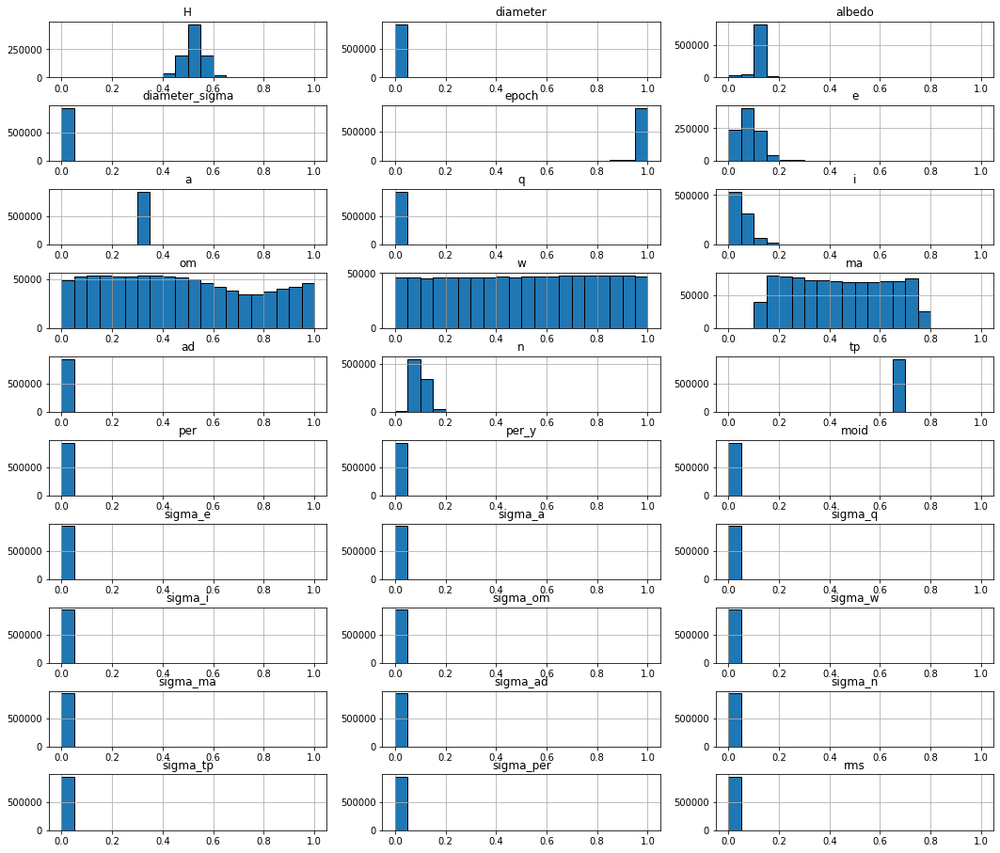

{'accuracy': 0.04759288929579614, 'precision': 0.9549491011818313, 'recall': 0.04759288929579614, 'F1': 0.09033141924388609}
{'accuracy': 0.9999643956155744, 'precision': 0.9999644036564173, 'recall': 0.9999643956155744, 'F1': 0.9996235952035275}


In [11]:
plot_hist_all_columns(df)

nb_met = classification_metrics(y_test, nb_pred)
svm_met = classification_metrics(y_test, rf_pred)

print(nb_met)
print(svm_met)

In [12]:
plot_decision_tree(rf.estimators_[0], X_train, y_train, df.columns, ['Safe', 'Dangerous'])

## Conclusie
#### Welke classifier had het beste resultaat?
Random Forest heeft het beste resultaat, met een recall van 0.999+
#### Kwam dit overeen met de voorspelling? Waarom wel/niet?
Tegenstrijdig met mijn verwachtingen, heeft Naive Bayes het niet zo goed gedaan. Technisch heeft NB een recall van 1.0
weten te halen, maar dit komt omdat Naive Bayes simpel weg overal een 1 had voorspeld. Mijn vermoeden waarom dit is, is 
omdat de balans van de labels simpelweg te ongelijk is, en Naive Bayes hier niet mee om kan gaan. 

Random Forest lijkt dit niet te doen, en heeft de dataset ook echt geleerd, en dan met dat een geweldige score behaald. 
Daarom vind ik dat Random Forest het beste resultaat heeft.